# Car-Removal Project
Authors:
 - Nikita Makarevich, 153989
 - Szymon Siemieniuk, 151947

In [163]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from copy import deepcopy

In [164]:
paths = [
    "resources/DJI_20231031123704_0017_W.JPG",
    "resources/DJI_20231031123719_0022_W.JPG",
    "resources/DJI_20231031123746_0031_W.JPG"
]

orig_imgs = [cv2.imread(path, cv2.IMREAD_COLOR) for path in paths]

In [165]:
def convert_to_gray(imgs: list):    
    imgs_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in imgs]
    return imgs_gray

def convert_to_hsv(imgs: list):    
    imgs_hsv = [cv2.cvtColor(img, cv2.COLOR_BGR2HSV) for img in imgs]
    return imgs_hsv


orig_imgs_gray = convert_to_gray(orig_imgs)
orig_imgs_hsv = convert_to_hsv(orig_imgs)

In [166]:
def vert_concat(*args):
    return np.concatenate([*args], axis=0)

def horiz_concat(*args):
    return np.concatenate([*args], axis=1)

def imshow(img: np.ndarray, scale=0.4, in_bgr=True):
    if in_bgr and img.shape[-1]==3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    
    display(Image.fromarray(img))

## Dataset Analysis

The dataset contains three images, each describing the road with cars.
The target is to create an image where the road is without any car.

All these images look like this:

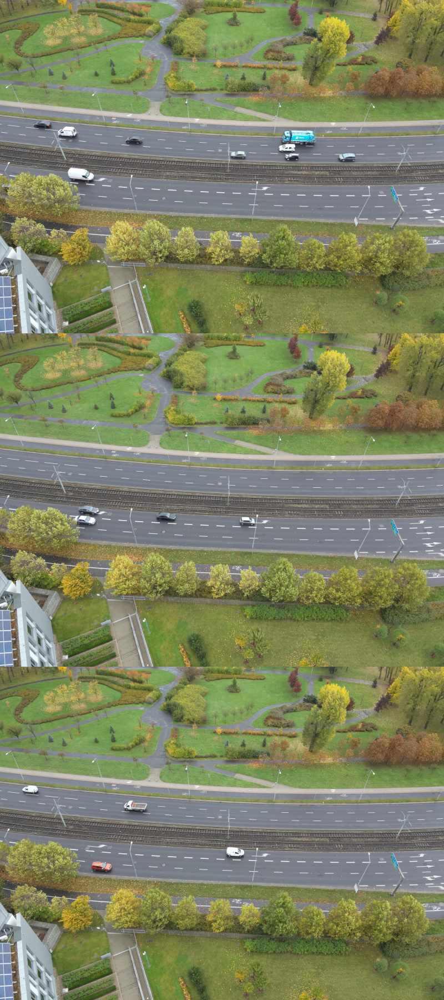

In [167]:
imshow(vert_concat(*orig_imgs), in_bgr=True)

### Statistics and plots
(todo)

### Differences between images
(todo)

### Difficuly of area
(todo)

# Attemts to solving the task

We had four approaches, three unsuccessful and one successful.

## 1. Median approach

Steps:
1. For each image, calculate the sum of R, G, B components of each pixel.
2. Create **min image**, where each pixel is a copy from the image which had
for that the lowest sum of all components
3. Apply median between two copies of **min image** and three remaining images.

Min image:

![Min image](./report_images/min_image.png "Min image")

Median image:

![Median image](./report_images/med_image.png "Median image")

As we can see, despite removing some of the cars, there are still contours
of them. One car was almost untouched, so that this method was unsuccessful.

## 2. Edge detection technique

(TODO)

1. Gaussian blur
2. Canny edge detection
3. Descriptor (???)
4. For each resulting pixel, take the copy of image with the lowest respective
pixel.

Canny edges:

![Canny edges](./report_images/canny_edges.png "")

Resulting image:

![Resulting image of canny](./report_images/canny_res.png "")

This approach was much better but still not the best since there are remaining
contours of wheels and strange shadows.

## 3. Harris Corner Detector

1. Same as #2, but apply Harris Corner detector

Corner detection for one of the image:

![Harris Corner example](./report_images/harris_example.png)

Result:

![Harris Corner final image](./report_images/harris_result.png)

The effect was much worse that #2. Silhouettes are very visible.

## Attempt 4: Keypoints

Choose pixel with the smallest number of keypoints in its neighborhood

In [183]:
def show_kp(img, kp):
    img_kp = cv2.drawKeypoints(
        img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT
    )
    return img_kp

In [184]:
sift = cv2.SIFT_create()
orb = cv2.ORB_create()
fast = cv2.FastFeatureDetector_create()
star = cv2.xfeatures2d.StarDetector_create()

Keypoints from all detectors:


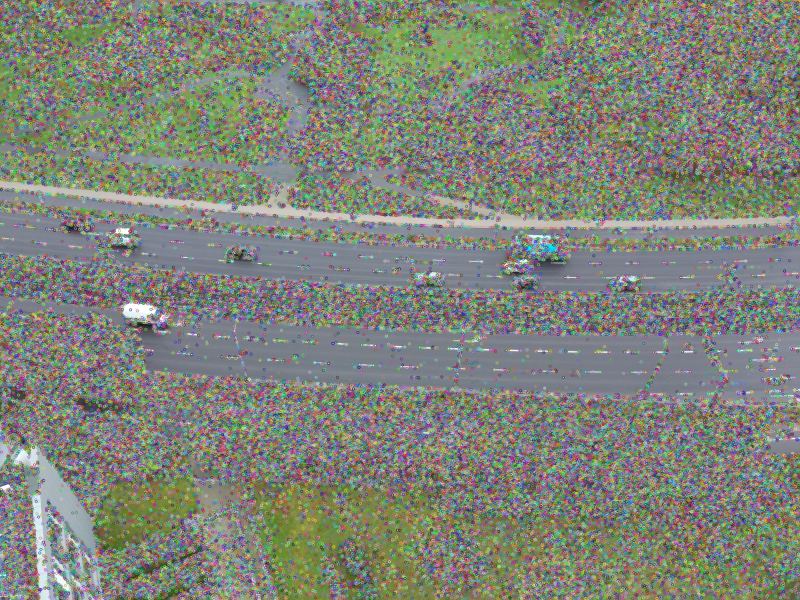

In [185]:
sift_kp, sift_desc = sift.detectAndCompute(orig_imgs_gray[0], None)
orb_kp, orb_desc = orb.detectAndCompute(orig_imgs_gray[0], None)
fast_kp = fast.detect(orig_imgs_gray[0], None)
star_kp = star.detect(orig_imgs_gray[0], None)

print("Keypoints from all detectors:")
imshow(show_kp(orig_imgs[0], (sift_kp+orb_kp+fast_kp+star_kp)))

In [186]:
def get_near_kps_descriptor(img: np.ndarray, kp_detectors: list, window_size: int = 50):
    """First finds keypoint using given detectors, sums them for each pixel, and then 
    calculates a descriptor of the total number of keypoints detected around a given pixel in window"""

    total_mask = np.zeros(img.shape[:2])
    for kp_detector in kp_detectors:
        kps = kp_detector.detect(img, None)
        kp_coords = np.array([kp.pt for kp in kps], dtype=np.uint)

        kp_mask = np.zeros(img.shape[:2], dtype=np.uint8)
        kp_mask[kp_coords[:, 1], kp_coords[:, 0]] = 1

        total_mask += kp_mask

    kernel = np.ones((window_size, window_size))
    pixel_descs = cv2.filter2D(total_mask, -1, kernel, cv2.BORDER_ISOLATED)
    return pixel_descs

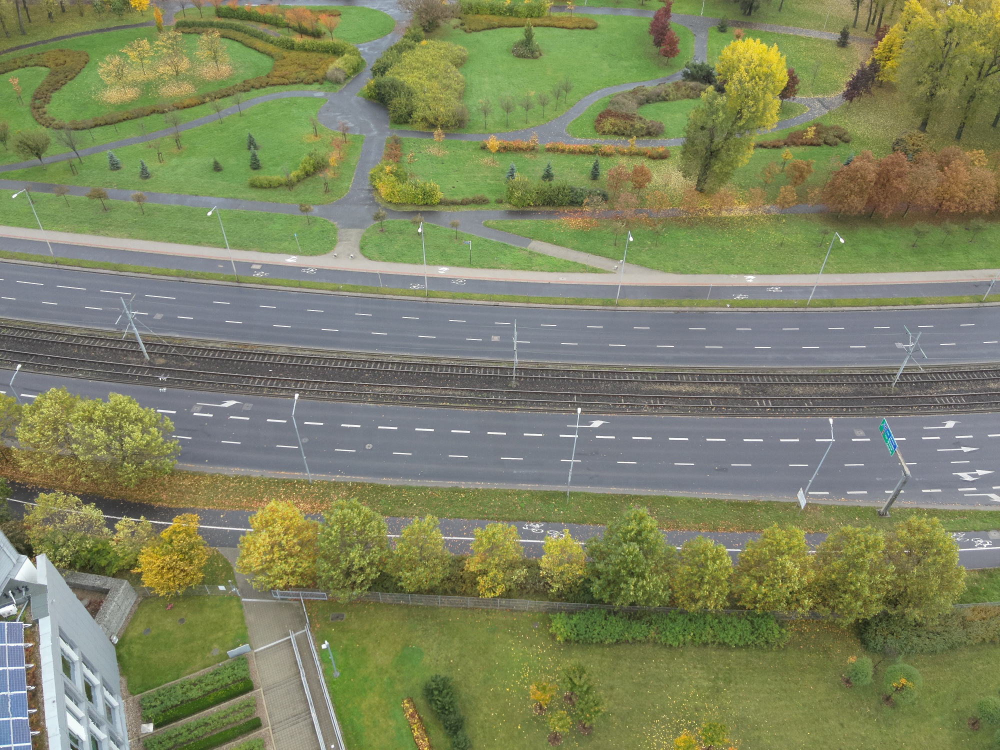

In [187]:
pixel_descs = [get_near_kps_descriptor(img, [sift, orb, fast, star], window_size=100)[np.newaxis] for img in orig_imgs]
all_pixel_descs = np.vstack(pixel_descs)
best_inds = all_pixel_descs.argmin(axis=0)
res_img = take_pixels_from_imgs(orig_imgs, best_inds)
imshow(res_img, scale=1.0)